In [1]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
!wget https://github.com/younggon2/Education-ComputerVision-DeepLearning/raw/master/res/Lung_Segmentation.zip

--2025-03-07 16:01:46--  https://github.com/younggon2/Education-ComputerVision-DeepLearning/raw/master/res/Lung_Segmentation.zip
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/younggon2/Education-ComputerVision-DeepLearning/master/res/Lung_Segmentation.zip [following]
--2025-03-07 16:01:46--  https://media.githubusercontent.com/media/younggon2/Education-ComputerVision-DeepLearning/master/res/Lung_Segmentation.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 56097894 (53M) [application/zip]
Saving to: ‘Lung_Segmentation.zip’

Lung_Segmentation.z 100%[===================>]  53.

In [3]:
!unzip Lung_Segmentation.zip

Archive:  Lung_Segmentation.zip
  inflating: image/resize_CHNCXR_0001_0.png  
  inflating: image/resize_CHNCXR_0002_0.png  
  inflating: image/resize_CHNCXR_0003_0.png  
  inflating: image/resize_CHNCXR_0004_0.png  
  inflating: image/resize_CHNCXR_0005_0.png  
  inflating: image/resize_CHNCXR_0006_0.png  
  inflating: image/resize_CHNCXR_0007_0.png  
  inflating: image/resize_CHNCXR_0008_0.png  
  inflating: image/resize_CHNCXR_0009_0.png  
  inflating: image/resize_CHNCXR_0010_0.png  
  inflating: image/resize_CHNCXR_0011_0.png  
  inflating: image/resize_CHNCXR_0012_0.png  
  inflating: image/resize_CHNCXR_0013_0.png  
  inflating: image/resize_CHNCXR_0014_0.png  
  inflating: image/resize_CHNCXR_0015_0.png  
  inflating: image/resize_CHNCXR_0016_0.png  
  inflating: image/resize_CHNCXR_0017_0.png  
  inflating: image/resize_CHNCXR_0018_0.png  
  inflating: image/resize_CHNCXR_0019_0.png  
  inflating: image/resize_CHNCXR_0020_0.png  
  inflating: image/resize_CHNCXR_0021_0.png  
  

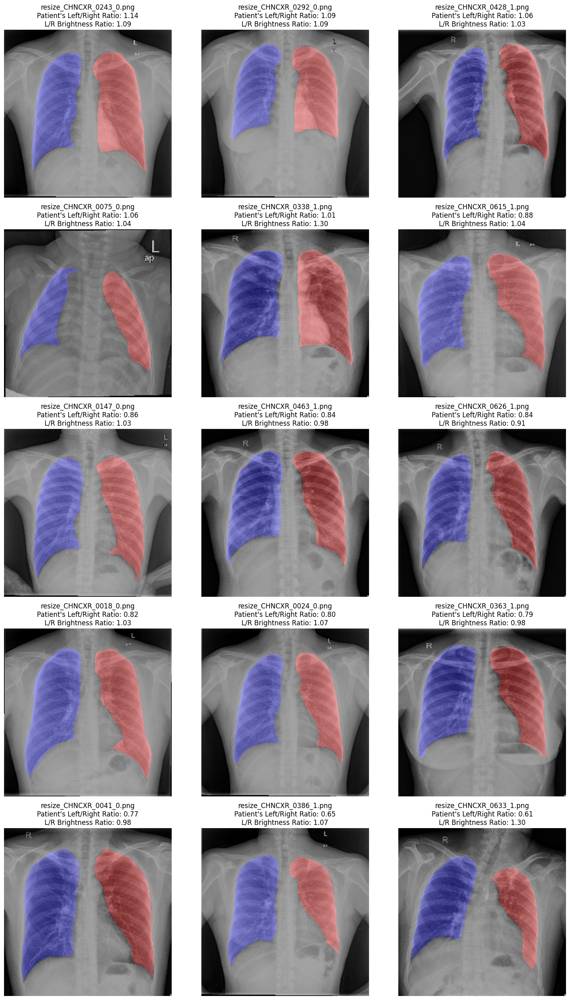

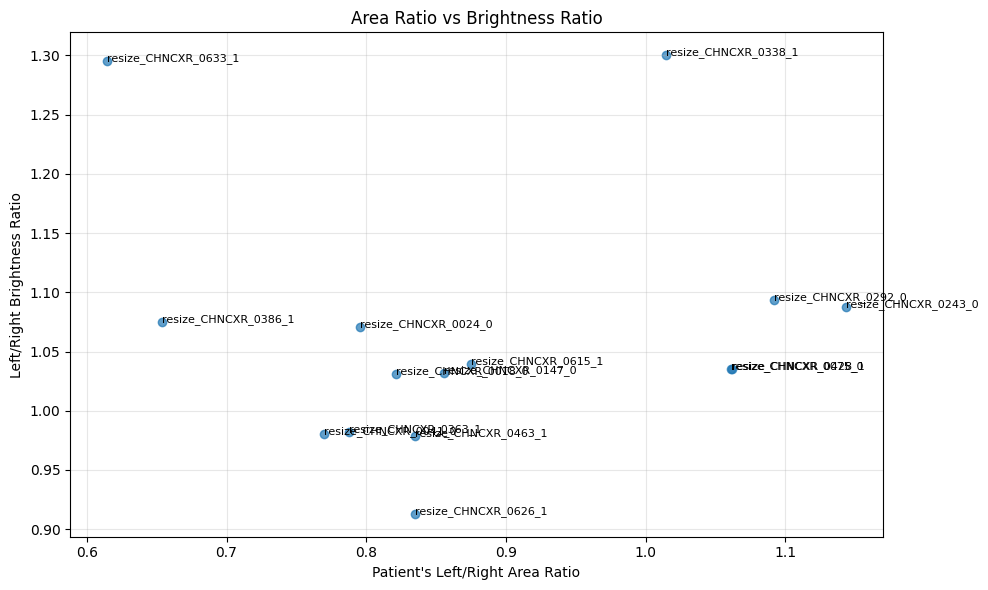

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from scipy.ndimage import label, center_of_mass

# 분석할 15개 이미지 리스트
selected_images = [
    "resize_CHNCXR_0243_0.png",
    "resize_CHNCXR_0292_0.png",
    "resize_CHNCXR_0428_1.png",
    "resize_CHNCXR_0075_0.png",
    "resize_CHNCXR_0338_1.png",
    "resize_CHNCXR_0615_1.png",
    "resize_CHNCXR_0147_0.png",
    "resize_CHNCXR_0463_1.png",
    "resize_CHNCXR_0626_1.png",
    "resize_CHNCXR_0018_0.png",
    "resize_CHNCXR_0024_0.png",
    "resize_CHNCXR_0363_1.png",
    "resize_CHNCXR_0041_0.png",
    "resize_CHNCXR_0386_1.png",
    "resize_CHNCXR_0633_1.png"
]

def separate_lungs(mask):

    # 이미지를 이진화하여 흑백으로 전환
    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # Contour 검출
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 노이즈 제거 및 큰 영역만 선택
    contours = [c for c in contours if cv2.contourArea(c) > 100]

    # 좌우 폐를 위한 빈 마스크 생성
    h, w = binary_mask.shape
    left_lung_mask = np.zeros_like(binary_mask)
    right_lung_mask = np.zeros_like(binary_mask)

    if len(contours) < 2:
        # 폐가 2개 미만으로 감지된 경우 이미지 중앙을 기준으로 좌우 분리
        right_lung_mask[:, :w//2] = binary_mask[:, :w//2]
        left_lung_mask[:, w//2:] = binary_mask[:, w//2:]
        return left_lung_mask, right_lung_mask

    # 면적이 큰 순서대로 정렬하여 가장 큰 contour 2개 선택
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]

    # 각 윤곽선의 중심점을 계산하여 좌우 구분
    centers = []
    for c in contours:
        M = cv2.moments(c)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            centers.append((cx, c))

    # x좌표를 기준으로 정렬
    centers.sort(key=lambda x: x[0])

    # 우측 폐 (이미지 좌측)
    cv2.drawContours(right_lung_mask, [centers[0][1]], -1, 255, -1)

    # 좌측 폐 (이미지 우측)
    cv2.drawContours(left_lung_mask, [centers[1][1]], -1, 255, -1)

    return left_lung_mask, right_lung_mask

def analyze_specific_masks(image_dir, label_dir, selected_images):

    results = []

    for filename in selected_images:
        # 마스크 이미지 로드
        mask_path = os.path.join(label_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if mask is None:
            print(f"마스크 이미지를 로드할 수 없습니다: {mask_path}")
            continue

        # 원본 이미지 로드
        image_path = os.path.join(image_dir, filename)
        if os.path.exists(image_path):
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        else:
            print(f"원본 이미지를 찾을 수 없습니다: {image_path}")
            continue

        # 좌우 폐 분리 (환자 기준)
        left_lung_mask, right_lung_mask = separate_lungs(mask)

        # 픽셀값을 세서 면적을 계산
        left_area = np.sum(left_lung_mask > 0)
        right_area = np.sum(right_lung_mask > 0)
        area_ratio = left_area / right_area if right_area > 0 else 0

        # 좌측 폐 영역의 원본 이미지 밝기값 분석
        left_lung_pixels = image[left_lung_mask > 0]
        right_lung_pixels = image[right_lung_mask > 0]

        # 밝기값 통계
        left_brightness_mean = np.mean(left_lung_pixels) if len(left_lung_pixels) > 0 else 0
        right_brightness_mean = np.mean(right_lung_pixels) if len(right_lung_pixels) > 0 else 0
        brightness_ratio = left_brightness_mean / right_brightness_mean if right_brightness_mean > 0 else 0

        results.append({
            'filename': filename,
            'area_ratio': area_ratio,
            'brightness_ratio': brightness_ratio,
            'image': image,
            'left_lung_mask': left_lung_mask,
            'right_lung_mask': right_lung_mask
        })

    return results

def visualize_samples(results):
    """
    샘플 마스크 분석 결과 시각화
    """
    n_samples = len(results)
    rows = (n_samples + 2) // 3

    plt.figure(figsize=(15, 5 * rows))

    for i, result in enumerate(results):
        plt.subplot(rows, 3, i + 1)

        # 원본 이미지 표시
        plt.imshow(result['image'], cmap='gray')

        # 마스크 오버레이
        overlay = np.zeros((*result['image'].shape, 3))
        overlay[result['left_lung_mask'] > 0] = [1, 0, 0]   # 환자의 좌측 폐 (이미지 우측): 빨간색
        overlay[result['right_lung_mask'] > 0] = [0, 0, 1]  # 환자의 우측 폐 (이미지 좌측): 파란색

        plt.imshow(overlay, alpha=0.3)

        plt.title(f"{result['filename']}\n"
                 f"Patient's Left/Right Ratio: {result['area_ratio']:.2f}\n"
                 f"L/R Brightness Ratio: {result['brightness_ratio']:.2f}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    # 밝기값과 면적 비율의 관계 산점도
    plt.figure(figsize=(10, 6))

    area_ratios = [r['area_ratio'] for r in results]
    brightness_ratios = [r['brightness_ratio'] for r in results]

    plt.scatter(area_ratios, brightness_ratios, alpha=0.7)
    for i, result in enumerate(results):
        plt.annotate(result['filename'].split('.')[0],
                    (area_ratios[i], brightness_ratios[i]),
                    fontsize=8)
    plt.xlabel("Patient's Left/Right Area Ratio")
    plt.ylabel('Left/Right Brightness Ratio')
    plt.title('Area Ratio vs Brightness Ratio')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# 실행
image_dir = "/content/image/"
label_dir = "/content/label/"
results = analyze_specific_masks(image_dir, label_dir, selected_images)
visualize_samples(results)

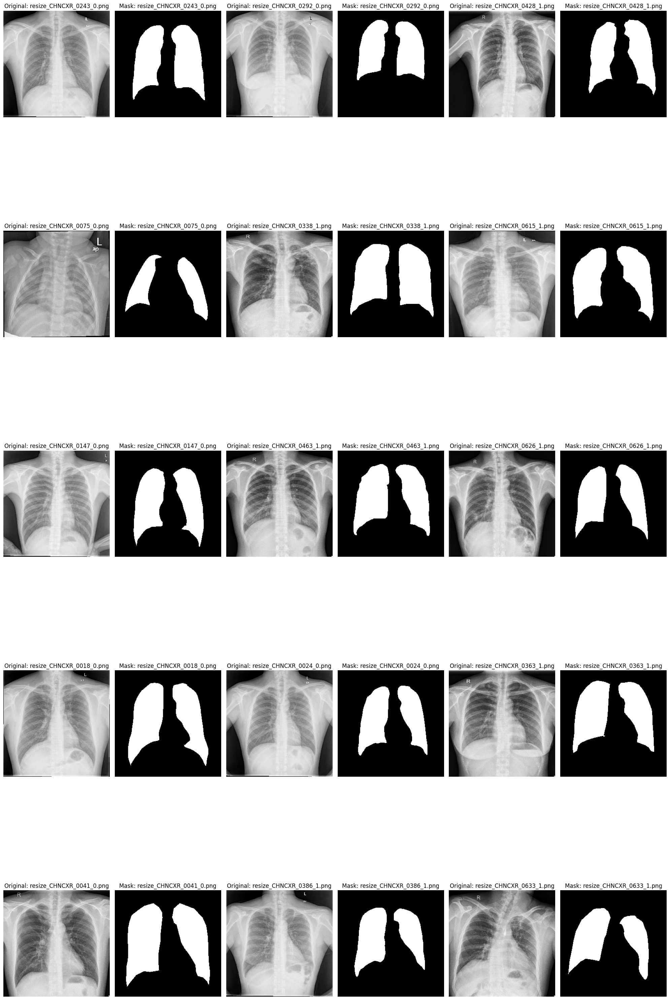

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# 분석한 15개 이미지 파일명 리스트
selected_images = [
    "resize_CHNCXR_0243_0.png",
    "resize_CHNCXR_0292_0.png",
    "resize_CHNCXR_0428_1.png",
    "resize_CHNCXR_0075_0.png",
    "resize_CHNCXR_0338_1.png",
    "resize_CHNCXR_0615_1.png",
    "resize_CHNCXR_0147_0.png",
    "resize_CHNCXR_0463_1.png",
    "resize_CHNCXR_0626_1.png",
    "resize_CHNCXR_0018_0.png",
    "resize_CHNCXR_0024_0.png",
    "resize_CHNCXR_0363_1.png",
    "resize_CHNCXR_0041_0.png",
    "resize_CHNCXR_0386_1.png",
    "resize_CHNCXR_0633_1.png"
]

def visualize_original_and_mask(image_dir, label_dir, selected_images):
    """
    선택된 이미지들의 원본과 마스크를 시각화하는 함수

    Parameters:
    - image_dir: 원본 X-ray 이미지가 있는 디렉토리 경로
    - label_dir: 마스크 이미지가 있는 디렉토리 경로
    - selected_images: 시각화할 이미지 파일명 리스트
    """

    # 이미지 개수에 따라 행 수 계산 (한 행에 3개씩)
    n_images = len(selected_images)
    rows = (n_images + 2) // 3

    # 전체 Figure 생성
    plt.figure(figsize=(20, 7*rows))

    for idx, filename in enumerate(selected_images):
        # 원본 이미지 로드
        image_path = os.path.join(image_dir, filename)
        original = cv2.imread(image_path)
        if original is None:
            print(f"원본 이미지를 찾을 수 없습니다: {image_path}")
            continue
        original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        # 마스크 이미지 로드
        mask_path = os.path.join(label_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            print(f"마스크 이미지를 찾을 수 없습니다: {mask_path}")
            continue

        # 원본 이미지 표시
        plt.subplot(rows, 6, 2*idx + 1)
        plt.imshow(original, cmap='gray')
        plt.title(f"Original: {filename}")
        plt.axis('off')

        # 마스크 이미지 표시
        plt.subplot(rows, 6, 2*idx + 2)
        plt.imshow(mask, cmap='gray')
        plt.title(f"Mask: {filename}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 함수 실행
# image_dir과 label_dir은 실제 경로로 수정 필요
image_dir = "/content/image/"
label_dir = "/content/label/"
visualize_original_and_mask(image_dir, label_dir, selected_images)

In [4]:
import os
import numpy as np
import cv2
from tqdm import tqdm

def analyze_mask_brightness(image_path, mask_path):
    """
    마스크의 좌우 폐 영역 밝기값 비율 분석 (Contour 기반)
    """
    # 이미지 로드
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if image is None or mask is None:
        return None

    # 이진화
    _, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # Contour 검출
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # 노이즈 제거 및 큰 영역만 선택
    contours = [c for c in contours if cv2.contourArea(c) > 100]

    # 좌우 폐를 위한 빈 마스크 생성
    h, w = binary_mask.shape
    left_lung_mask = np.zeros_like(binary_mask)
    right_lung_mask = np.zeros_like(binary_mask)

    if len(contours) < 2:
        # 폐가 2개 미만으로 감지된 경우 이미지 중앙을 기준으로 좌우 분리
        right_lung_mask[:, :w//2] = binary_mask[:, :w//2]
        left_lung_mask[:, w//2:] = binary_mask[:, w//2:]
    else:
        # 면적이 큰 순서대로 정렬하여 가장 큰 contour 2개 선택
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:2]

        # 각 윤곽선의 중심점을 계산하여 좌우 구분
        centers = []
        for c in contours:
            M = cv2.moments(c)
            if M["m00"] != 0:
                cx = int(M["m10"] / M["m00"])
                centers.append((cx, c))

        # x좌표를 기준으로 정렬
        centers.sort(key=lambda x: x[0])

        # 우측 폐 (이미지 좌측)
        cv2.drawContours(right_lung_mask, [centers[0][1]], -1, 255, -1)

        # 좌측 폐 (이미지 우측)
        cv2.drawContours(left_lung_mask, [centers[1][1]], -1, 255, -1)

    # 각 폐 영역의 원본 이미지 밝기값 분석
    left_lung_pixels = image[left_lung_mask > 0]
    right_lung_pixels = image[right_lung_mask > 0]

    if len(left_lung_pixels) == 0 or len(right_lung_pixels) == 0:
        return None

    # 밝기값 비율 계산
    left_brightness = np.mean(left_lung_pixels)
    right_brightness = np.mean(right_lung_pixels)
    brightness_ratio = left_brightness / right_brightness if right_brightness > 0 else 0

    return brightness_ratio

def find_heart_included_masks(image_dir, label_dir, output_dir, brightness_threshold=1.1):
    """
    심장 영역이 포함된 마스크 찾기 및 저장
    """
    # 출력 디렉토리 생성
    os.makedirs(output_dir, exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(output_dir, 'masks'), exist_ok=True)

    # 결과 저장을 위한 리스트
    heart_included_files = []

    # 모든 마스크 파일 처리
    mask_files = [f for f in os.listdir(label_dir) if f.endswith('.png')]
    print(f"총 {len(mask_files)}개의 마스크 파일 분석 중...")

    for filename in tqdm(mask_files):
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(label_dir, filename)

        # 밝기값 비율 분석
        brightness_ratio = analyze_mask_brightness(image_path, mask_path)

        if brightness_ratio is None:
            continue

        # 심장 영역 포함 여부 판단
        if brightness_ratio >= brightness_threshold:
            heart_included_files.append({
                'filename': filename,
                'brightness_ratio': brightness_ratio
            })

            # 파일 복사
            cv2.imwrite(os.path.join(output_dir, 'images', filename),
                       cv2.imread(image_path))
            cv2.imwrite(os.path.join(output_dir, 'masks', filename),
                       cv2.imread(mask_path))

    # 결과 저장
    with open(os.path.join(output_dir, 'heart_included_files.txt'), 'w') as f:
        f.write("Filename,Brightness Ratio\n")
        for item in sorted(heart_included_files, key=lambda x: x['brightness_ratio'], reverse=True):
            f.write(f"{item['filename']},{item['brightness_ratio']:.3f}\n")

    print(f"\n분석 완료!")
    print(f"총 {len(heart_included_files)}개의 심장 영역 포함 마스크를 찾았습니다.")
    print(f"결과가 {output_dir} 디렉토리에 저장되었습니다.")

    return heart_included_files

# 실행
image_dir = "/content/image/"
label_dir = "/content/label/"
output_dir = "/content/heart_included_masks/"

results = find_heart_included_masks(image_dir, label_dir, output_dir)

총 566개의 마스크 파일 분석 중...


100%|██████████| 566/566 [00:02<00:00, 196.06it/s]



분석 완료!
총 56개의 심장 영역 포함 마스크를 찾았습니다.
결과가 /content/heart_included_masks/ 디렉토리에 저장되었습니다.


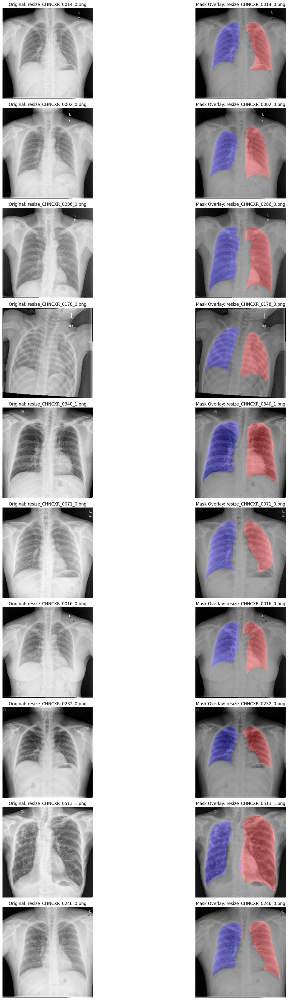

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

def visualize_random_samples(output_dir, num_samples=10):
    """
    심장 영역 포함 마스크 중 랜덤하게 num_samples개를 선택하여 시각화
    """
    # 이미지와 마스크 경로
    images_dir = os.path.join(output_dir, 'images')
    masks_dir = os.path.join(output_dir, 'masks')

    # 파일 목록 가져오기
    files = os.listdir(images_dir)

    # 랜덤하게 num_samples개 선택
    selected_files = random.sample(files, num_samples)

    # 시각화
    plt.figure(figsize=(20, 4*num_samples))

    for idx, filename in enumerate(selected_files):
        # 원본 이미지 로드
        image_path = os.path.join(images_dir, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # 마스크 이미지 로드
        mask_path = os.path.join(masks_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # 원본 이미지 표시
        plt.subplot(num_samples, 2, 2*idx + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f"Original: {filename}")
        plt.axis('off')

        # 마스크 오버레이 표시
        plt.subplot(num_samples, 2, 2*idx + 2)
        plt.imshow(image, cmap='gray')

        # 마스크 오버레이 (빨간색: 좌측 폐, 파란색: 우측 폐)
        overlay = np.zeros((*image.shape, 3))
        h, w = mask.shape
        left_mask = np.zeros_like(mask)
        right_mask = np.zeros_like(mask)
        left_mask[:, w//2:] = mask[:, w//2:]    # 환자의 좌측 폐 (이미지 우측)
        right_mask[:, :w//2] = mask[:, :w//2]   # 환자의 우측 폐 (이미지 좌측)

        overlay[left_mask > 0] = [1, 0, 0]   # 빨간색
        overlay[right_mask > 0] = [0, 0, 1]   # 파란색

        plt.imshow(overlay, alpha=0.3)
        plt.title(f"Mask Overlay: {filename}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 실행
output_dir = "/content/heart_included_masks/"
visualize_random_samples(output_dir, num_samples=10)

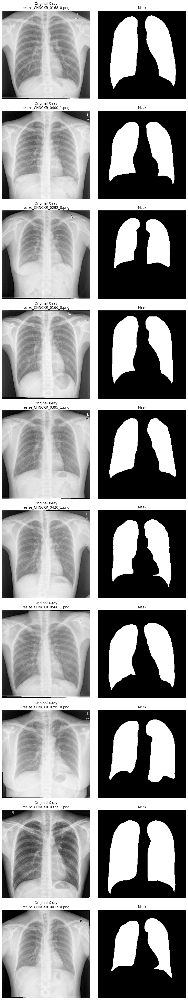

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# 분석된 이미지 리스트
selected_images = [
    "resize_CHNCXR_0168_0.png",
    "resize_CHNCXR_0400_1.png",
    "resize_CHNCXR_0292_0.png",
    "resize_CHNCXR_0166_0.png",
    "resize_CHNCXR_0395_1.png",
    "resize_CHNCXR_0420_1.png",
    "resize_CHNCXR_0566_1.png",
    "resize_CHNCXR_0295_0.png",
    "resize_CHNCXR_0327_1.png",
    "resize_CHNCXR_0017_0.png"
]

def visualize_images(image_dir, label_dir, selected_images):
    """
    원본과 마스크 이미지를 함께 시각화
    """
    n_images = len(selected_images)
    plt.figure(figsize=(10, 5 * n_images))

    for idx, filename in enumerate(selected_images):
        # 이미지 로드
        image_path = os.path.join(image_dir, filename)
        mask_path = os.path.join(label_dir, filename)

        # 원본 이미지
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        # 마스크 이미지
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if image is None or mask is None:
            print(f"Cannot load images for {filename}")
            continue

        # 원본 X-ray 표시
        plt.subplot(n_images, 2, 2*idx + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f"Original X-ray\n{filename}")
        plt.axis('off')

        # 마스크 이미지 표시
        plt.subplot(n_images, 2, 2*idx + 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 실행
image_dir = "/content/image/"
label_dir = "/content/label/"
visualize_images(image_dir, label_dir, selected_images)

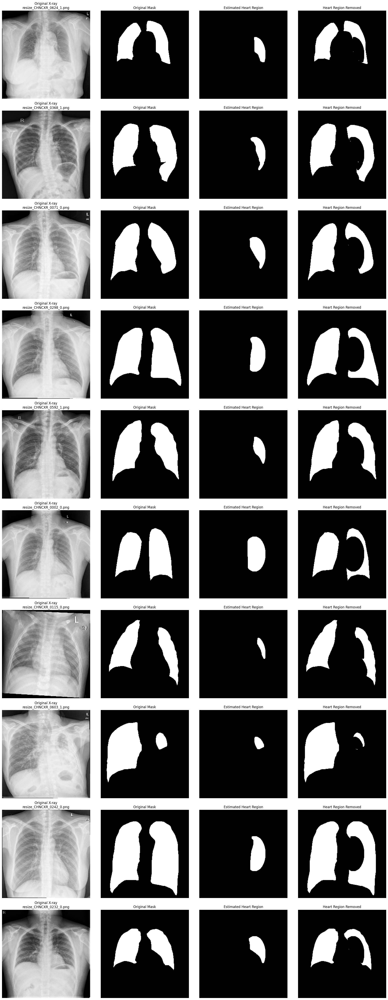


선택된 파일들:
resize_CHNCXR_0624_1.png
resize_CHNCXR_0368_1.png
resize_CHNCXR_0071_0.png
resize_CHNCXR_0298_0.png
resize_CHNCXR_0592_1.png
resize_CHNCXR_0002_0.png
resize_CHNCXR_0115_0.png
resize_CHNCXR_0603_1.png
resize_CHNCXR_0242_0.png
resize_CHNCXR_0232_0.png
총 56개의 마스크 처리 중...
처리 완료!
결과가 /content/processed_masks/에 저장되었습니다.


In [9]:
#심장 영역 제거 코드#
import random
import matplotlib.pyplot as plt

def detect_heart_region_v4(mask):
    h, w = mask.shape

    # 1. 좌측 폐 마스크 추출
    left_lung = np.zeros_like(mask)
    left_lung[:, w//2:] = mask[:, w//2:]

    # 2. 심장 영역 기본 형태 생성 (타원형)
    center_x = w // 2
    heart_width = int(w * 0.25)  # 폭 조정
    heart_height = int(h * 0.4)  # 높이 조정
    heart_y = int(h * 0.3)  # 시작 위치 조정

    # 3. 타원형 마스크 생성
    heart_region = np.zeros_like(mask)
    y, x = np.ogrid[:h, :w]
    center_y = heart_y + heart_height//2

    # 타원 방정식
    ellipse_mask = ((x - (center_x + heart_width//2))**2 / (heart_width//2)**2 +
                    (y - center_y)**2 / (heart_height//2)**2) <= 1.0
    heart_region[ellipse_mask] = 255

    # 4. 좌측 폐와의 교집합
    heart_region = cv2.bitwise_and(heart_region, left_lung)

    # 5. 경계 스무딩 개선
    # 가우시안 블러 적용
    heart_region = cv2.GaussianBlur(heart_region, (7,7), 2) #7X7 크기 창을 이용해 이웃 픽셀들 고려, 표준편차 2
    _, heart_region = cv2.threshold(heart_region, 127, 255, cv2.THRESH_BINARY) #127보다 크면 255, 이하면 0

    # 모폴로지 연산 커널 크기 증가 및 반복 적용
    kernel_close = np.ones((9,9), np.uint8)
    kernel_open = np.ones((5,5), np.uint8)

    heart_region = cv2.morphologyEx(heart_region, cv2.MORPH_CLOSE, kernel_close)
    heart_region = cv2.morphologyEx(heart_region, cv2.MORPH_OPEN, kernel_open)
    heart_region = cv2.morphologyEx(heart_region, cv2.MORPH_CLOSE, kernel_close)

    # 최종 가우시안 블러 및 이진화
    heart_region = cv2.GaussianBlur(heart_region, (5,5), 1)
    _, heart_region = cv2.threshold(heart_region, 127, 255, cv2.THRESH_BINARY)

    # 6. 새로운 마스크 생성
    new_mask = mask.copy()
    new_mask[heart_region > 0] = 0

    return new_mask, heart_region

def test_heart_removal_v2(image_dir, label_dir, heart_included_dir, num_samples=10):
    """
    개선된 테스트 함수
    """
    # heart_included_files.txt 읽기
    with open(os.path.join(heart_included_dir, 'heart_included_files.txt'), 'r') as f:
        next(f)  # 헤더 스킵
        files = [line.strip().split(',')[0] for line in f]

    # 랜덤 샘플 선택
    selected_files = random.sample(files, num_samples)

    # 결과 시각화
    plt.figure(figsize=(20, 5 * num_samples))

    for idx, filename in enumerate(selected_files):
        # 원본 X-ray 이미지 로드
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # 마스크 로드
        mask_path = os.path.join(label_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # 심장 영역 제거
        result, heart_region = detect_heart_region_v4(mask)

        # 시각화
        plt.subplot(num_samples, 4, 4*idx + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original X-ray\n{filename}')
        plt.axis('off')

        plt.subplot(num_samples, 4, 4*idx + 2)
        plt.imshow(mask, cmap='gray')
        plt.title('Original Mask')
        plt.axis('off')

        plt.subplot(num_samples, 4, 4*idx + 3)
        plt.imshow(heart_region, cmap='gray')
        plt.title('Estimated Heart Region')
        plt.axis('off')

        plt.subplot(num_samples, 4, 4*idx + 4)
        plt.imshow(result, cmap='gray')
        plt.title('Heart Region Removed')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return selected_files

def process_all_masks(image_dir, label_dir, heart_included_dir, output_dir):
    """
    모든 마스크 처리 및 저장
    """
    # 출력 디렉토리 생성
    os.makedirs(output_dir, exist_ok=True)

    # heart_included_files.txt 읽기
    with open(os.path.join(heart_included_dir, 'heart_included_files.txt'), 'r') as f:
        next(f)  # 헤더 스킵
        files = [line.strip().split(',')[0] for line in f]

    print(f"총 {len(files)}개의 마스크 처리 중...")

    for filename in files:
        # 마스크 로드
        mask_path = os.path.join(label_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # 심장 영역 제거
        result, _ = detect_heart_region_v4(mask)

        # 결과 저장
        output_path = os.path.join(output_dir, filename)
        cv2.imwrite(output_path, result)

    print("처리 완료!")
    print(f"결과가 {output_dir}에 저장되었습니다.")

# 디렉토리 경로 설정
image_dir = "/content/image/"
label_dir = "/content/label/"
heart_included_dir = "/content/heart_included_masks/"
output_dir = "/content/processed_masks/"

# 테스트 실행 (10개 샘플)
selected_files = test_heart_removal_v2(image_dir, label_dir, heart_included_dir)
print("\n선택된 파일들:")
for file in selected_files:
    print(file)

# 모든 마스크 처리 및 저장
process_all_masks(image_dir, label_dir, heart_included_dir, output_dir)

In [10]:
import shutil
import os
import cv2
import numpy as np

def prepare_final_dataset(original_label_dir, processed_mask_dir, output_dir):
    """
    최종 데이터셋 준비 함수
    """
    # 출력 디렉토리 생성
    os.makedirs(output_dir, exist_ok=True)

    # 1. heart_included_files.txt에서 처리된 파일 목록 가져오기
    with open(os.path.join("/content/heart_included_masks/", 'heart_included_files.txt'), 'r') as f:
        next(f)  # 헤더 스킵
        processed_files = [line.strip().split(',')[0] for line in f]

    # 2. 원본 디렉토리의 모든 파일 가져오기
    all_files = os.listdir(original_label_dir)

    print(f"전체 파일 수: {len(all_files)}")
    print(f"처리된 파일 수: {len(processed_files)}")

    # 3. 파일 복사 및 병합
    for filename in all_files:
        if filename in processed_files:
            # 처리된 마스크 복사
            src_path = os.path.join(processed_mask_dir, filename)
            dst_path = os.path.join(output_dir, filename)
            shutil.copy2(src_path, dst_path)
            print(f"처리된 마스크 복사: {filename}")
        else:
            # 원본 마스크 복사
            src_path = os.path.join(original_label_dir, filename)
            dst_path = os.path.join(output_dir, filename)
            shutil.copy2(src_path, dst_path)
            print(f"원본 마스크 복사: {filename}")

    # 4. 결과 확인
    final_files = os.listdir(output_dir)
    print("\n데이터셋 준비 완료!")
    print(f"최종 파일 수: {len(final_files)}")
    print(f"저장 위치: {output_dir}")

# 경로 설정
original_label_dir = "/content/label/"  # 원본 마스크 디렉토리
processed_mask_dir = "/content/processed_masks/"  # 처리된 마스크 디렉토리
final_dataset_dir = "/content/final_masks/"  # 최종 데이터셋 저장 디렉토리

# 실행
prepare_final_dataset(original_label_dir, processed_mask_dir, final_dataset_dir)

전체 파일 수: 566
처리된 파일 수: 56
원본 마스크 복사: resize_CHNCXR_0412_1.png
원본 마스크 복사: resize_CHNCXR_0273_0.png
원본 마스크 복사: resize_CHNCXR_0373_1.png
원본 마스크 복사: resize_CHNCXR_0028_0.png
원본 마스크 복사: resize_CHNCXR_0461_1.png
원본 마스크 복사: resize_CHNCXR_0067_0.png
원본 마스크 복사: resize_CHNCXR_0617_1.png
원본 마스크 복사: resize_CHNCXR_0030_0.png
원본 마스크 복사: resize_CHNCXR_0278_0.png
원본 마스크 복사: resize_CHNCXR_0304_0.png
처리된 마스크 복사: resize_CHNCXR_0064_0.png
원본 마스크 복사: resize_CHNCXR_0543_1.png
원본 마스크 복사: resize_CHNCXR_0554_1.png
원본 마스크 복사: resize_CHNCXR_0101_0.png
원본 마스크 복사: resize_CHNCXR_0227_0.png
원본 마스크 복사: resize_CHNCXR_0555_1.png
원본 마스크 복사: resize_CHNCXR_0449_1.png
원본 마스크 복사: resize_CHNCXR_0093_0.png
원본 마스크 복사: resize_CHNCXR_0018_0.png
원본 마스크 복사: resize_CHNCXR_0257_0.png
원본 마스크 복사: resize_CHNCXR_0312_0.png
원본 마스크 복사: resize_CHNCXR_0372_1.png
처리된 마스크 복사: resize_CHNCXR_0001_0.png
처리된 마스크 복사: resize_CHNCXR_0289_0.png
원본 마스크 복사: resize_CHNCXR_0456_1.png
원본 마스크 복사: resize_CHNCXR_0523_1.png
원본 마스크 복사: resize_CHNCXR_0585_1.png

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [12]:
# 데이터 로드 및 전처리 함수
def load_data(image_dir, mask_dir):
    images = []
    masks = []

    # 파일 목록 가져오기
    files = sorted(os.listdir(image_dir))

    print("데이터 로딩 시작...")
    for filename in files:
        # 이미지 로드 및 전처리
        img_path = os.path.join(image_dir, filename)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (256, 256))
        img = img / 255.0  # 정규화

        # 마스크 로드 및 전처리
        mask_path = os.path.join(mask_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (256, 256))
        mask = mask / 255.0  # 정규화

        # 채널 차원 추가
        img = np.expand_dims(img, axis=-1)
        mask = np.expand_dims(mask, axis=-1)

        images.append(img)
        masks.append(mask)

    print(f"총 {len(images)}개의 이미지 로드 완료")
    return np.array(images), np.array(masks)

In [13]:
# U-Net 모델 정의
def unet(input_size=(256,256,1)):
    inputs = Input(input_size)

    # Encoder
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPool2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPool2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPool2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPool2D(pool_size=(2, 2))(conv4)

    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)

    # Decoder
    up6 = Concatenate()([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4])
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)

    up7 = Concatenate()([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3])
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)

    up8 = Concatenate()([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2])
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
    conv8 = BatchNormalization()(conv8)

    up9 = Concatenate()([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1])
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)
    conv9 = BatchNormalization()(conv9)

    conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

    return Model(inputs=[inputs], outputs=[conv10])

In [14]:
# Dice coefficient 및 loss 함수 정의
def dice_coef(y_true, y_pred, smooth=1.0):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2])
    union = tf.reduce_sum(y_true, axis=[1,2]) + tf.reduce_sum(y_pred, axis=[1,2])
    dice = (2. * intersection + smooth) / (union + smooth)
    return tf.reduce_mean(dice)

def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

데이터 로딩 시작...
총 566개의 이미지 로드 완료
데이터 분할 완료:
훈련 데이터: 361
검증 데이터: 91
테스트 데이터: 114
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 256, 256, 1))
  warnings.warn(msg)


46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 525ms/step - accuracy: 0.7276 - dice_coef: 0.5682 - loss: 0.4319
Epoch 1: val_dice_coef improved from -inf to 0.28965, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 73s 774ms/step - accuracy: 0.7298 - dice_coef: 0.5708 - loss: 0.4294 - val_accuracy: 0.7533 - val_dice_coef: 0.2896 - val_loss: 0.7092
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - accuracy: 0.9655 - dice_coef: 0.8829 - loss: 0.1171
Epoch 2: val_dice_coef did not improve from 0.28965
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - accuracy: 0.9656 - dice_coef: 0.8832 - loss: 0.1169 - val_accuracy: 0.7533 - val_dice_coef: 0.1968 - val_loss: 0.8026
Epoch 3/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9725 - dice_coef: 0.9142 - loss: 0.0858
Epoch 3: val_dice_coef did not improve from 0.28965
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 169ms/step - accuracy: 0.9725 - dice_coef: 0.9144 - loss: 0.0857 - val_accuracy: 0.7533 - val_dice_coef: 0.1085 - val_loss: 0.8913
Epoch 4/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.9749 - dice_coef: 0.9263 - loss: 0.0737
Epoch 4: val_dice_coef did not improve from 0.28965
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 170ms/s

46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 184ms/step - accuracy: 0.9808 - dice_coef: 0.9519 - loss: 0.0481 - val_accuracy: 0.8296 - val_dice_coef: 0.4004 - val_loss: 0.5919
Epoch 10/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.9819 - dice_coef: 0.9553 - loss: 0.0447
Epoch 10: val_dice_coef improved from 0.40044 to 0.63664, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 11s 199ms/step - accuracy: 0.9819 - dice_coef: 0.9553 - loss: 0.0447 - val_accuracy: 0.8855 - val_dice_coef: 0.6366 - val_loss: 0.3523
Epoch 11/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9816 - dice_coef: 0.9558 - loss: 0.0442
Epoch 11: val_dice_coef did not improve from 0.63664
46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 187ms/step - accuracy: 0.9816 - dice_coef: 0.9558 - loss: 0.0443 - val_accuracy: 0.8208 - val_dice_coef: 0.4086 - val_loss: 0.5868
Epoch 12/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.9811 - dice_coef: 0.9554 - loss: 0.0446
Epoch 12: val_dice_coef improved from 0.63664 to 0.89192, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 11s 194ms/step - accuracy: 0.9811 - dice_coef: 0.9554 - loss: 0.0446 - val_accuracy: 0.9554 - val_dice_coef: 0.8919 - val_loss: 0.1071
Epoch 13/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9818 - dice_coef: 0.9576 - loss: 0.0424
Epoch 13: val_dice_coef improved from 0.89192 to 0.94109, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 188ms/step - accuracy: 0.9819 - dice_coef: 0.9577 - loss: 0.0424 - val_accuracy: 0.9741 - val_dice_coef: 0.9411 - val_loss: 0.0587
Epoch 14/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9827 - dice_coef: 0.9600 - loss: 0.0400
Epoch 14: val_dice_coef improved from 0.94109 to 0.94736, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - accuracy: 0.9827 - dice_coef: 0.9600 - loss: 0.0400 - val_accuracy: 0.9767 - val_dice_coef: 0.9474 - val_loss: 0.0528
Epoch 15/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9841 - dice_coef: 0.9631 - loss: 0.0369
Epoch 15: val_dice_coef did not improve from 0.94736
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.9841 - dice_coef: 0.9631 - loss: 0.0369 - val_accuracy: 0.9752 - val_dice_coef: 0.9446 - val_loss: 0.0555
Epoch 16/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9843 - dice_coef: 0.9639 - loss: 0.0361
Epoch 16: val_dice_coef did not improve from 0.94736
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9843 - dice_coef: 0.9639 - loss: 0.0361 - val_accuracy: 0.9741 - val_dice_coef: 0.9416 - val_loss: 0.0581
Epoch 17/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9837 - dice_coef: 0.9631 - loss: 0.0369
Epoch 17: val_dice_coef did not improve from 0.94736
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 

46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 189ms/step - accuracy: 0.9857 - dice_coef: 0.9677 - loss: 0.0323 - val_accuracy: 0.9760 - val_dice_coef: 0.9477 - val_loss: 0.0524
Epoch 20/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.9860 - dice_coef: 0.9689 - loss: 0.0311
Epoch 20: val_dice_coef did not improve from 0.94767
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.9861 - dice_coef: 0.9689 - loss: 0.0311 - val_accuracy: 0.9757 - val_dice_coef: 0.9463 - val_loss: 0.0537
Epoch 21/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9854 - dice_coef: 0.9679 - loss: 0.0321
Epoch 21: val_dice_coef did not improve from 0.94767
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9855 - dice_coef: 0.9680 - loss: 0.0320 - val_accuracy: 0.9752 - val_dice_coef: 0.9454 - val_loss: 0.0547
Epoch 22/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.9860 - dice_coef: 0.9691 - loss: 0.0309
Epoch 22: val_dice_coef did not improve from 0.94767
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 179

46/46 ━━━━━━━━━━━━━━━━━━━━ 11s 184ms/step - accuracy: 0.9873 - dice_coef: 0.9718 - loss: 0.0282 - val_accuracy: 0.9766 - val_dice_coef: 0.9484 - val_loss: 0.0516
Epoch 24/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9875 - dice_coef: 0.9724 - loss: 0.0276
Epoch 24: val_dice_coef did not improve from 0.94842
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.9875 - dice_coef: 0.9724 - loss: 0.0276 - val_accuracy: 0.9762 - val_dice_coef: 0.9476 - val_loss: 0.0524
Epoch 25/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9882 - dice_coef: 0.9739 - loss: 0.0261
Epoch 25: val_dice_coef did not improve from 0.94842
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.9882 - dice_coef: 0.9739 - loss: 0.0261 - val_accuracy: 0.9752 - val_dice_coef: 0.9464 - val_loss: 0.0538
Epoch 26/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9886 - dice_coef: 0.9748 - loss: 0.0252
Epoch 26: val_dice_coef did not improve from 0.94842
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 

46/46 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step - accuracy: 0.9889 - dice_coef: 0.9757 - loss: 0.0243 - val_accuracy: 0.9766 - val_dice_coef: 0.9489 - val_loss: 0.0510
Epoch 31/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9904 - dice_coef: 0.9791 - loss: 0.0209
Epoch 31: val_dice_coef did not improve from 0.94889
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9904 - dice_coef: 0.9791 - loss: 0.0209 - val_accuracy: 0.9759 - val_dice_coef: 0.9481 - val_loss: 0.0521
Epoch 32/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9913 - dice_coef: 0.9809 - loss: 0.0191
Epoch 32: val_dice_coef did not improve from 0.94889
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9913 - dice_coef: 0.9809 - loss: 0.0192 - val_accuracy: 0.9740 - val_dice_coef: 0.9429 - val_loss: 0.0568
Epoch 33/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9908 - dice_coef: 0.9800 - loss: 0.0200
Epoch 33: val_dice_coef did not improve from 0.94889
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 17

46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 193ms/step - accuracy: 0.9915 - dice_coef: 0.9814 - loss: 0.0186 - val_accuracy: 0.9763 - val_dice_coef: 0.9492 - val_loss: 0.0511
Epoch 36/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9914 - dice_coef: 0.9815 - loss: 0.0185
Epoch 36: val_dice_coef did not improve from 0.94916
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.9915 - dice_coef: 0.9816 - loss: 0.0185 - val_accuracy: 0.9758 - val_dice_coef: 0.9481 - val_loss: 0.0520
Epoch 37/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9913 - dice_coef: 0.9811 - loss: 0.0189
Epoch 37: val_dice_coef did not improve from 0.94916
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 178ms/step - accuracy: 0.9913 - dice_coef: 0.9812 - loss: 0.0189 - val_accuracy: 0.9745 - val_dice_coef: 0.9464 - val_loss: 0.0541
Epoch 38/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9924 - dice_coef: 0.9834 - loss: 0.0166
Epoch 38: val_dice_coef did not improve from 0.94916
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 178

46/46 ━━━━━━━━━━━━━━━━━━━━ 11s 185ms/step - accuracy: 0.9921 - dice_coef: 0.9830 - loss: 0.0170 - val_accuracy: 0.9768 - val_dice_coef: 0.9500 - val_loss: 0.0500
Epoch 43/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9922 - dice_coef: 0.9831 - loss: 0.0169
Epoch 43: val_dice_coef did not improve from 0.95004
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 179ms/step - accuracy: 0.9922 - dice_coef: 0.9831 - loss: 0.0169 - val_accuracy: 0.9749 - val_dice_coef: 0.9462 - val_loss: 0.0540
Epoch 44/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.9920 - dice_coef: 0.9828 - loss: 0.0172
Epoch 44: val_dice_coef did not improve from 0.95004
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.9920 - dice_coef: 0.9828 - loss: 0.0172 - val_accuracy: 0.9746 - val_dice_coef: 0.9460 - val_loss: 0.0542
Epoch 45/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.9924 - dice_coef: 0.9837 - loss: 0.0163
Epoch 45: val_dice_coef improved from 0.95004 to 0.95073, saving model to lung_segment

46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 187ms/step - accuracy: 0.9924 - dice_coef: 0.9838 - loss: 0.0162 - val_accuracy: 0.9768 - val_dice_coef: 0.9507 - val_loss: 0.0494
Epoch 46/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.9938 - dice_coef: 0.9865 - loss: 0.0135
Epoch 46: val_dice_coef improved from 0.95073 to 0.95184, saving model to lung_segmentation_model.h5


46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 189ms/step - accuracy: 0.9938 - dice_coef: 0.9865 - loss: 0.0135 - val_accuracy: 0.9773 - val_dice_coef: 0.9518 - val_loss: 0.0483
Epoch 47/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9942 - dice_coef: 0.9873 - loss: 0.0127
Epoch 47: val_dice_coef did not improve from 0.95184
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9942 - dice_coef: 0.9873 - loss: 0.0127 - val_accuracy: 0.9764 - val_dice_coef: 0.9496 - val_loss: 0.0503
Epoch 48/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9939 - dice_coef: 0.9869 - loss: 0.0131
Epoch 48: val_dice_coef did not improve from 0.95184
46/46 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9939 - dice_coef: 0.9869 - loss: 0.0131 - val_accuracy: 0.9754 - val_dice_coef: 0.9473 - val_loss: 0.0527
Epoch 49/100
45/46 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9933 - dice_coef: 0.9856 - loss: 0.0144
Epoch 49: val_dice_coef did not improve from 0.95184
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 176

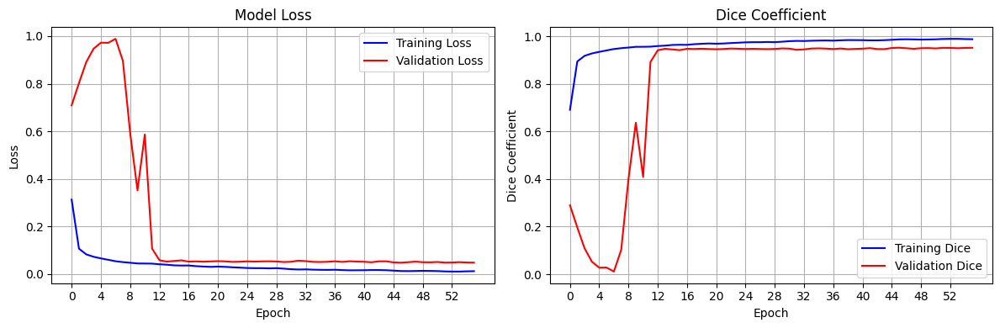

In [15]:
# 메인 실행 코드
if __name__ == "__main__":
    # 재현성을 위한 시드 설정
    seed = 7
    np.random.seed(seed)
    tf.random.set_seed(seed)

    # 데이터 경로 설정 (Colab 환경에 맞게 경로 수정)
    image_dir = "/content/image/"
    mask_dir = "/content/final_masks/"

    # 데이터 로드
    X_all, y_all = load_data(image_dir, mask_dir)

    # 데이터 분할
    X_train, X_test, y_train, y_test = train_test_split(X_all, y_all, test_size=0.2, random_state=seed)
    X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=seed)

    print("데이터 분할 완료:")
    print(f"훈련 데이터: {len(X_train)}")
    print(f"검증 데이터: {len(X_valid)}")
    print(f"테스트 데이터: {len(X_test)}")

    # 모델 생성 및 컴파일
    model = unet()
    model.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss=dice_coef_loss,
        metrics=[dice_coef, 'accuracy']
    )

    # 콜백 정의
    callbacks = [
        EarlyStopping(
            monitor='val_dice_coef',  # 검증 세트의 Dice coefficient 모니터링
            mode='max',               # Dice coefficient는 클수록 좋으므로
            patience=10,              # 10 에폭 동안 개선이 없으면 학습 중단
            restore_best_weights=True,
            verbose=1
        ),
        ModelCheckpoint(
            'lung_segmentation_model.h5',
            monitor='val_dice_coef',
            mode='max',
            save_best_only=True,
            verbose=1
        )
    ]

    # 모델 학습
    history = model.fit(
        X_train,
        y_train,
        validation_data=(X_valid, y_valid),
        batch_size=8,
        epochs=100,
        callbacks=callbacks,
        verbose=1
    )

    # 테스트 데이터 평가
    test_results = model.evaluate(X_test, y_test, verbose=0)

    # 최종 성능 출력
    print("\n=== Final Model Performance ===")
    print(f"Training Loss: {history.history['loss'][-1]:.4f}")
    print(f"Training Dice Coefficient: {history.history['dice_coef'][-1]:.4f}")
    print(f"Validation Loss: {history.history['val_loss'][-1]:.4f}")
    print(f"Validation Dice Coefficient: {history.history['val_dice_coef'][-1]:.4f}")
    print(f"Test Loss: {test_results[0]:.4f}")
    print(f"Test Dice Coefficient: {test_results[1]:.4f}")

    # 학습 과정 시각화
    plt.figure(figsize=(12, 4))

    # Loss 그래프
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], 'b-', label='Training Loss')
    plt.plot(history.history['val_loss'], 'r-', label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(0, len(history.history['loss']), 4))

    # Dice Coefficient 그래프
    plt.subplot(1, 2, 2)
    plt.plot(history.history['dice_coef'], 'b-', label='Training Dice')
    plt.plot(history.history['val_dice_coef'], 'r-', label='Validation Dice')
    plt.title('Dice Coefficient')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Coefficient')
    plt.legend()
    plt.grid(True)
    plt.xticks(range(0, len(history.history['dice_coef']), 4))

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


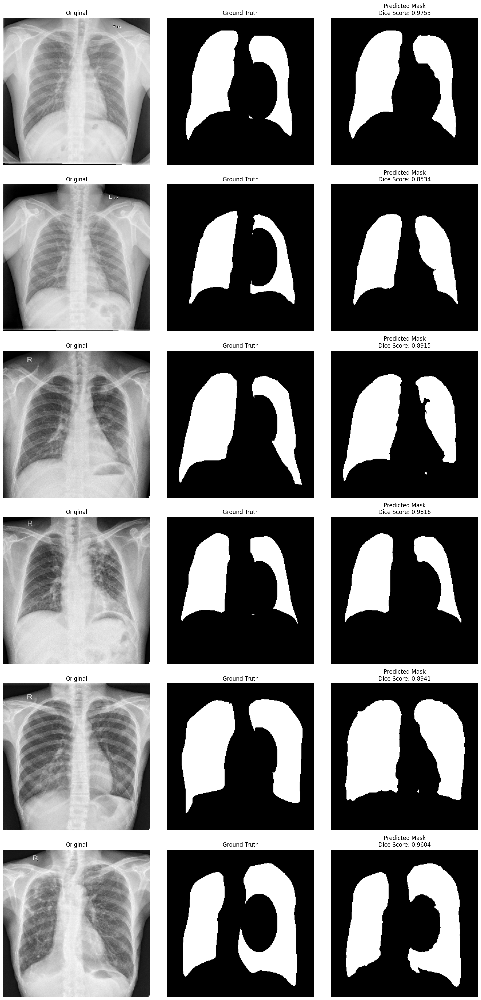

In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Dice Score 계산 (NumPy 기반)
def dice_coef_np(y_true, y_pred, eps=1e-7):
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    dice = (2.0 * intersection + eps) / (union + eps)
    return dice

# 모델 로드 (단일 채널 출력)
model_path = "/content/lung_segmentation_model.h5"
model = tf.keras.models.load_model(model_path, compile=False)

# 예측 함수: 입력 이미지를 전처리하고 단일 채널 예측 마스크 반환
def predict_lungs(model, img, input_size=(256,256)):
    # 이미지가 컬러라면 grayscale로 변환
    if len(img.shape) == 3:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img_gray = img
    # 리사이즈 및 정규화
    img_resized = cv2.resize(img_gray, input_size)
    img_norm = img_resized / 255.0
    input_tensor = np.expand_dims(img_norm, axis=(0, -1))  # shape: (1, H, W, 1)
    # 모델 예측 (출력 shape: (1, H, W, 1))
    pred = model.predict(input_tensor)[0]
    # 0.5 임계값을 이용해 이진화: 예측 마스크
    pred_mask = (pred[..., 0] > 0.5).astype(np.uint8)
    return pred_mask

# Ground Truth 로드 함수
def load_ground_truth(gt_path, input_size=(256,256)):
    gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
    if gt is None:
        raise FileNotFoundError(f"Cannot read file: {gt_path}")
    gt_resized = cv2.resize(gt, input_size)
    gt_bin = (gt_resized > 127).astype(np.uint8)
    return gt_bin

# 시각화 대상 이미지 파일 목록 (6장)
selected_paths = [
    "/content/heart_included_masks/images/resize_CHNCXR_0250_0.png",
    "/content/heart_included_masks/images/resize_CHNCXR_0290_0.png",
    "/content/heart_included_masks/images/resize_CHNCXR_0435_1.png",
    "/content/heart_included_masks/images/resize_CHNCXR_0474_1.png",
    "/content/heart_included_masks/images/resize_CHNCXR_0507_1.png",
    "/content/heart_included_masks/images/resize_CHNCXR_0513_1.png"
]

plt.figure(figsize=(15, 5 * len(selected_paths)))

for idx, ref_path in enumerate(selected_paths):
    # 파일명 추출 (예: resize_CHNCXR_0435_1.png)
    base_name = os.path.basename(ref_path)

    # 1) Original: image 폴더에서 로드
    orig_path = os.path.join("/content/image", base_name)
    original = cv2.imread(orig_path)
    if original is None:
        print(f"Original image not found: {orig_path}")
        continue
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

    # 2) Ground Truth: final_masks 폴더에서 로드 (그레이스케일)
    gt_path = os.path.join("/content/final_masks", base_name)
    gt = load_ground_truth(gt_path, input_size=(256,256))

    # 3) Predicted Mask: 모델에 원본 이미지를 넣어 예측 (단일 채널)
    pred_mask = predict_lungs(model, original, input_size=(256,256))

    # Dice Score 계산 (Ground Truth와 예측 마스크 비교)
    dice_score = dice_coef_np(gt, pred_mask)

    # 시각화: 한 행에 3개 subplot
    # Subplot 1: Original X-ray
    plt.subplot(len(selected_paths), 3, 3 * idx + 1)
    plt.imshow(original_rgb)
    plt.title("Original")
    plt.axis("off")

    # Subplot 2: Ground Truth Mask
    plt.subplot(len(selected_paths), 3, 3 * idx + 2)
    plt.imshow(gt, cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    # Subplot 3: Predicted Mask (전체 폐 영역) + Dice Score
    plt.subplot(len(selected_paths), 3, 3 * idx + 3)
    plt.imshow(pred_mask, cmap="gray")
    plt.title(f"Predicted Mask\nDice Score: {dice_score:.4f}")
    plt.axis("off")

plt.tight_layout()
plt.show()

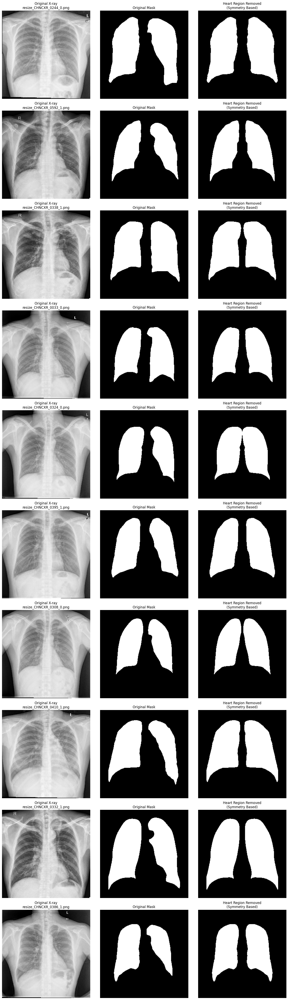


선택된 파일들:
resize_CHNCXR_0244_0.png
resize_CHNCXR_0592_1.png
resize_CHNCXR_0338_1.png
resize_CHNCXR_0033_0.png
resize_CHNCXR_0324_0.png
resize_CHNCXR_0395_1.png
resize_CHNCXR_0308_0.png
resize_CHNCXR_0410_1.png
resize_CHNCXR_0332_1.png
resize_CHNCXR_0386_1.png


In [ ]:
#대칭성을 통한 폐 마스크의 복원#
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

def remove_heart_region_v2(mask):
    """
    우측 폐의 대칭성을 활용한 심장 영역 제거
    """
    h, w = mask.shape

    # 우측 폐 마스크 추출 (이미지 좌측)
    right_lung = np.zeros_like(mask)
    right_lung[:, :w//2] = mask[:, :w//2]

    # 우측 폐 마스크 좌우 반전하여 좌측 폐 형태 추정
    estimated_left = cv2.flip(right_lung, 1)

    # 새로운 마스크 생성
    new_mask = mask.copy()
    new_mask[:, w//2:] = estimated_left[:, w//2:]

    return new_mask

def test_heart_removal(image_dir, label_dir, heart_included_dir, num_samples=10):
    """
    심장 영역 포함된 마스크들 중 랜덤 선택하여 테스트
    """
    # heart_included_files.txt 읽기
    with open(os.path.join(heart_included_dir, 'heart_included_files.txt'), 'r') as f:
        next(f)  # 헤더 스킵
        files = [line.split(',')[0] for line in f]

    # 랜덤 선택
    selected_files = random.sample(files, num_samples)

    # 결과 시각화
    plt.figure(figsize=(15, 5 * num_samples))

    for idx, filename in enumerate(selected_files):
        # 원본 이미지 로드
        image_path = os.path.join(image_dir, filename)
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        # 마스크 로드
        mask_path = os.path.join(label_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # 심장 영역 제거
        result = remove_heart_region_v2(mask)

        # 시각화
        plt.subplot(num_samples, 3, 3*idx + 1)
        plt.imshow(image, cmap='gray')
        plt.title(f'Original X-ray\n{filename}')
        plt.axis('off')

        plt.subplot(num_samples, 3, 3*idx + 2)
        plt.imshow(mask, cmap='gray')
        plt.title('Original Mask')
        plt.axis('off')

        plt.subplot(num_samples, 3, 3*idx + 3)
        plt.imshow(result, cmap='gray')
        plt.title('Heart Region Removed\n(Symmetry Based)')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

    return selected_files

# 실행
image_dir = "/content/image/"
label_dir = "/content/label/"
heart_included_dir = "/content/heart_included_masks/"

selected_files = test_heart_removal(image_dir, label_dir, heart_included_dir)
print("\n선택된 파일들:")
for f in selected_files:
    print(f)